# import modules

In [1]:
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, load_model, Model
from keras.layers import Dense, Dropout, Activation, Flatten, BatchNormalization
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import applications

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import os

C:\Users\Asus\Anaconda3\envs\AI\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
label_list = ['shoot', 'dribble', 'layup']

In [3]:
#get the imgs in dataset/train/shoot, dataset/train/dribble, dataset/train/layup
#do some images preprocessing: resize to (299, 299)
#put all images in a list name imgs
labels = []
imgs = []
class_num = 0
for folder in label_list:
    label_dir = os.path.join('../dataset/train/', folder)
    file_names = [os.path.join(label_dir, f) for f in os.listdir(label_dir) if (f.endswith('g')) | (f.endswith('G'))]
    print(folder, ' has :', len(file_names))
    for f in file_names:
        #print(f)
        img = cv2.imread(f)
        img = cv2.resize(img, (299, 299))
        labels.append(class_num)
        imgs.append(img)
    class_num += 1

shoot  has : 945
dribble  has : 967
layup  has : 869


In [4]:
imgs = np.array(imgs)
imgs = imgs[:, :, :, ::-1] #in openCV the channel is bgr, change to rgb
imgs.shape

(2781, 299, 299, 3)

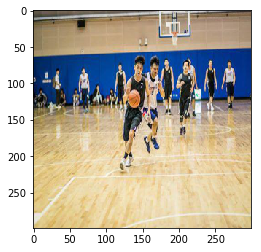

In [5]:
plt.imshow(imgs[946])

In [6]:
#one hot encoding for labels
train_df = pd.DataFrame()
train_df['classname'] = labels
class_y = pd.get_dummies(train_df['classname'], '').as_matrix()

In [7]:
#shuffle the training images
imgs, class_y = shuffle(imgs, class_y)

In [8]:
#split training imgs and label to x_train, y_tain, x_val, y_val
x_train, x_val, y_train, y_val = train_test_split(imgs, class_y, test_size=0.33, random_state = 7, shuffle=True)

print('input_data shape: training {training_shape} ; validation {testing_shape}'.format(
            training_shape=(x_train.shape), 
            testing_shape=(x_val.shape)))
print('y_true shape: training {training_shape} ; validation {testing_shape}'.format(
            training_shape=y_train.shape, 
            testing_shape=y_val.shape))

input_data shape: training (1863, 299, 299, 3) ; validation (918, 299, 299, 3)
y_true shape: training (1863, 3) ; validation (918, 3)


In [9]:
#normalization training data and validation data
x_train = x_train.astype('float32')
x_val = x_val.astype('float32')
x_train /= 255.
x_val /= 255.

In [33]:
import time
batch_size = 16
num_classes = 3
epochs = 50
input_shape = (299, 299, 3)
#setting the checkpoint dir and checkpoint model name
parent_path = os.path.abspath("..")
save_dir = os.path.join(parent_path, 'checkpoints/')
model_name = time.strftime('%m%d_%H_%M_%S.h5')

In [14]:
# base_model = applications.ResNet50(include_top=False, weights='imagenet')
from keras.applications.inception_v3 import InceptionV3
base_model = InceptionV3(input_shape=input_shape, weights='imagenet', include_top=False)

for i, layer in enumerate(base_model.layers):
    print(i, layer.name)

In [34]:
x = base_model.output
x = GlobalAveragePooling2D()(x)

x = Dense(1024, activation='relu')(x)
x = Dense(256, activation='relu')(x)

predictions = Dense(class_num, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# for layer in model.layers[:249]:
#     layer.trainable = False
# for layer in model.layers[249:]:
#     layer.trainable = True

# for layer in base_model.layers:
#     layer.trainable = False

# initiate Adam optimizer
opt = keras.optimizers.Adam(lr=0.0001)

# Let's train the model using Adam
model.compile(loss='categorical_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

print('Using real-time data augmentation.')
#This will do preprocessing and realtime data augmentation:
datagen = ImageDataGenerator(
    rotation_range=20,  # randomly rotate images in the range (degrees, 0 to 180)
    width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
    height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
    horizontal_flip=True,  # randomly flip images
    vertical_flip=False)  # randomly flip images

# earlystop
earlystop = EarlyStopping(monitor='val_loss', patience=30, verbose=1)

# Use ModelCheckpoint to save model and weights
if not os.path.isdir(save_dir):
    os.makedirs(save_dir)
model_path = os.path.join(save_dir, model_name)
checkpoint = ModelCheckpoint(model_path, monitor='val_loss', verbose=1, save_best_only=True)

model_history = model.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size),
                                    samples_per_epoch=(len(x_train)*2),
                                    shuffle=True,
                                    epochs=epochs,
                                    validation_data=(x_val, y_val),
                                    callbacks=[checkpoint])

# Score trained model.
scores = model.evaluate(x_val, y_val, verbose=1)
print('Val loss:', scores[0])
print('Val accuracy:', scores[1])

Using real-time data augmentation.


C:\Users\Asus\Anaconda3\envs\AI\lib\site-packages\ipykernel_launcher.py:50: UserWarning: Update your `fit_generator` call to the Keras 2 API: `fit_generator(<keras.pre..., shuffle=True, epochs=50, validation_data=(array([[[..., callbacks=[<keras.ca..., steps_per_epoch=232)`


Epoch 1/50
232/232 [==============================] - 94s 407ms/step - loss: 0.1208 - acc: 0.9642 - val_loss: 0.2911 - val_acc: 0.9194

Epoch 00001: val_loss improved from inf to 0.29111, saving model to D:\fang\AI_proj\bball_pub\checkpoints/0627_18_24_30.h5
Epoch 2/50
232/232 [==============================] - 89s 385ms/step - loss: 0.0879 - acc: 0.9746 - val_loss: 0.5068 - val_acc: 0.8954

Epoch 00002: val_loss did not improve
Epoch 3/50
232/232 [==============================] - 89s 382ms/step - loss: 0.0987 - acc: 0.9720 - val_loss: 0.4233 - val_acc: 0.8715

Epoch 00003: val_loss did not improve
Epoch 4/50
 33/232 [===>..........................] - ETA: 1:08 - loss: 0.0627 - acc: 0.9792

KeyboardInterrupt: 

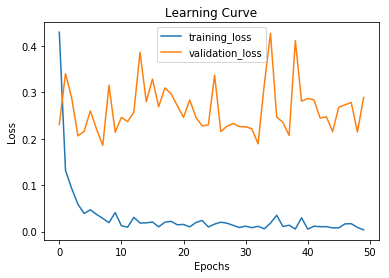

In [17]:
training_loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

plt.plot(training_loss, label="training_loss")
plt.plot(val_loss, label="validation_loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Learning Curve")
plt.legend(loc='best')
plt.show()

## save or load trained model 

In [35]:
from keras.models import load_model
#model.save('../models/keras_xception.h5')
model = load_model('../models/keras_inceptionV3_best.h5')

In [36]:
#preprocessing testing data
test_labels = []
test_imgs = []
class_num = 0
for folder in label_list:
    test_dir = os.path.join('../dataset/test/', folder)
    file_names = [os.path.join(test_dir, f) for f in os.listdir(test_dir) if (f.endswith('g')) | (f.endswith('G'))]
    print(folder, ' has :', len(file_names))
    for f in file_names:
        #print(f)
        img = cv2.imread(f)
        img = cv2.resize(img, (299, 299))
        test_labels.append(class_num)
        test_imgs.append(img)
    class_num += 1

test_imgs = np.array(test_imgs)
test_imgs = test_imgs[:, :, :, ::-1]

shoot  has : 100
dribble  has : 100
layup  has : 100


In [37]:
test_imgs = test_imgs.astype('float32')
test_imgs /= 255.
print('test imgs shape: ', test_imgs.shape, 'test labels shape: ', len(test_labels))

test imgs shape:  (300, 299, 299, 3) test labels shape:  300


In [38]:
import seaborn as sn
from sklearn.metrics import confusion_matrix

In [39]:
# Predict testing imgs
y_pred = model.predict(test_imgs)
y_pred = pd.DataFrame(y_pred)
# get index(class id) of maximum one, using idxmax()
y_pred = y_pred.idxmax(axis=1)
y_pred = pd.DataFrame(y_pred)
y_pred.columns = ['class']
y_pred = list(y_pred['class'])

## create confusion matrix

In [40]:
# turn y_test to list
y_list = pd.DataFrame(test_labels)

y_list.columns = ['class']
y_list = list(y_list['class'])

In [41]:
array = confusion_matrix(y_list, y_pred)
df_cm = pd.DataFrame(array, index = [i for i in "SDL"],
                  columns = [i for i in "SDL"])
df_prob = df_cm.astype('float') / df_cm.sum(axis=1)

Text(0.5,20.2686,'Predicted label')

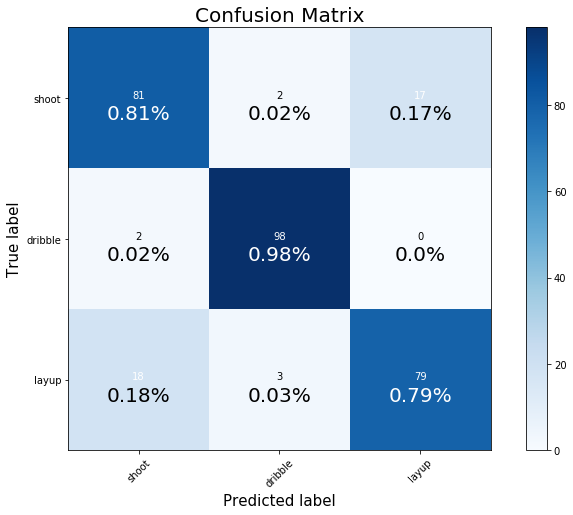

In [42]:
plt.figure(figsize = (10,7))
plt.imshow(df_cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix', fontsize=20)
plt.colorbar()
tick_marks = np.arange(len(label_list))
plt.xticks(tick_marks, label_list, rotation=45)
plt.yticks(tick_marks, label_list)

thresh = 10
thresh_prob = 0.5
for i in range(3):
    for j in range(3):
        plt.text(j, i, format(df_cm.iloc[i, j]),
                horizontalalignment="center",
                color="white" if df_cm.iloc[i, j] > thresh else "black")
        plt.text(j, i+0.15, format(df_prob.iloc[i, j]) + '%',
                horizontalalignment="center",
                color="white" if df_prob.iloc[i, j] > thresh_prob else "black",
                fontsize=20)

plt.tight_layout()
plt.ylabel('True label', fontsize=15)
plt.xlabel('Predicted label', fontsize=15)

## plot the error images

In [43]:
data_label_list = {'shoot':0, 'dribble':1, 'layup':2}
pred_error_list = []
for i in range(len(y_pred)):
    if y_list[i] != y_pred[i]:
        pred_error_list.append(i)
print('number of pred. error images in public set:', len(pred_error_list))

number of pred. error images in public set: 42


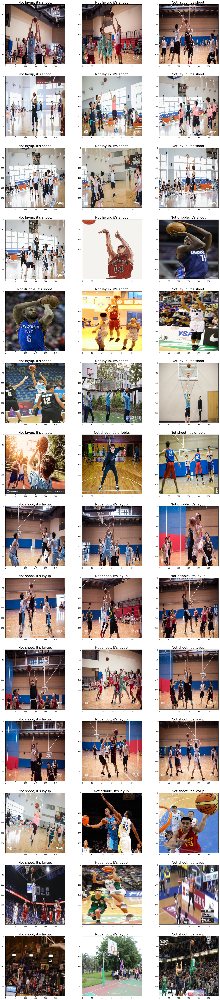

In [44]:
n = len(pred_error_list)
fig_size = (3*8, (int(n/3)+1)*8 )

fig = plt.figure(figsize=fig_size)
for i in range(len(pred_error_list)):
    ax = fig.add_subplot((n/3)+1,3,i+1)
    
    error_label = [key for key,value in data_label_list.items() if value == y_pred[pred_error_list[i]]]
    correct_label = [key for key,value in data_label_list.items() if value == y_list[pred_error_list[i]]]
    plt.title(('Not ' + error_label[0] + ', it\'s ' + correct_label[0] + '.'), fontsize=20)
    ax.imshow(test_imgs[pred_error_list[i]])

In [37]:
# def pred_img(img):
#     test_imgs = []
#     orig_img = cv2.imread(img)
#     orig_img = orig_img[:, :, ::-1]
#     test_img = cv2.resize(orig_img, (299, 299))
#     test_imgs.append(test_img)
#     test_imgs = np.array(test_imgs)
#     test_imgs = test_imgs.astype('float32')
#     test_imgs /= 255.
#     y_pred = model.predict(test_imgs)
#     plt.imshow(orig_img)
#     #print(y_pred)
#     if np.argmax(y_pred) == 0:
#         print('投籃機率：', y_pred.max())
#     if np.argmax(y_pred) == 1:
#         print('運球機率：', y_pred.max())
#     if np.argmax(y_pred) == 2:
#         print('上籃機率：', y_pred.max())